In [1]:
import math
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import cm

<center>

# <span style="color:blue;">Condizione iniziale</span>

<center>

La condizione iniziale che vogliamo prendere in considerazione è caratterizzata da un profilo continuo con gradienti non troppo accentuati. Per ottenere una situazione di questo genere proviamo a lavorare con un andamento del tipo:

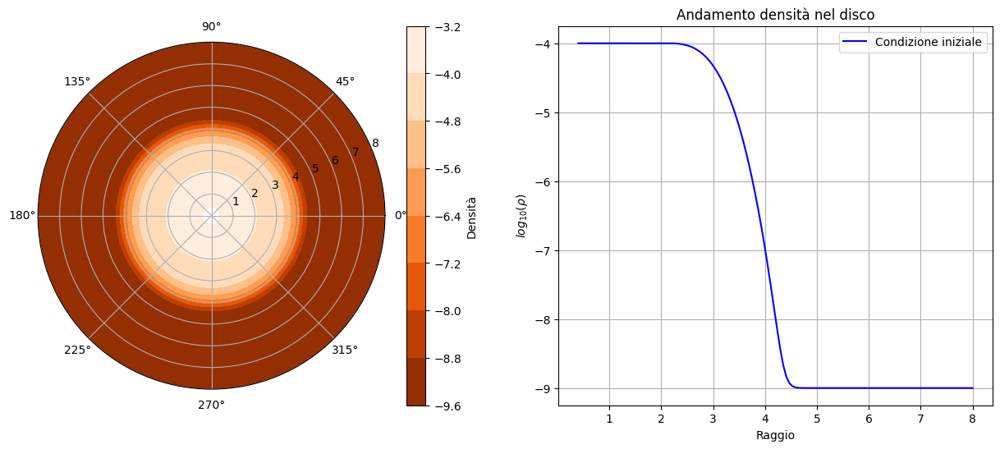

In [2]:
fig = plt.figure(figsize=(15, 6))

# Creare una griglia di valori R e Theta
theta = np.linspace(-np.pi, np.pi, 384)
r = np.linspace(0.4/12, 8.0/12, 128)
Theta, R = np.meshgrid(theta, r)

#Grafico 1
ax1 = fig.add_subplot(1, 2, 1, projection='polar')
rho = np.fromfile("Dati/Sistema2/CondIn/gasdens0.dat").reshape(128,384)
cax = ax1.contourf(Theta, R, np.log10(rho), cmap=cm.Oranges_r)
plt.colorbar(cax, label='Densità')
ax1.set_rmin(0)
ax1.set_rmax(8.0/12)


#Grafico 2
ax2 = fig.add_subplot(1, 2, 2)
den_sup = np.zeros(128)

#Determino andamento della densità superficiale
for i in range(0, 128):
    appo = 0
    for j in range(0, 384):
        appo += np.log10(rho[i, j])

    appo = appo/384
    den_sup[i] = appo

ax2.plot(np.linspace(0.4/12, 8.0/12, 128), den_sup[:], color = 'blue', label = 'Condizione iniziale')
ax2.set_title('Andamento densità nel disco')
ax2.set_xlabel('Raggio')
ax2.set_ylabel(r'$log_{10}(\rho)$')
ax2.grid(True)
ax2.legend()

plt.show()

<center>

# <span style="color:blue;">Prima Run</span>

<center>

Evolvo il sistema circa 100 periodi della binaria. L'orbita dura circa 20 evoluzioni a raggio 1 e quindi effettuando 2000 output raggiungo la situazione desiderata. In questo caso è ancora presente il dumping, perchè toglierlo mi da delle problematiche in fase di esecuzione.

### Orbite

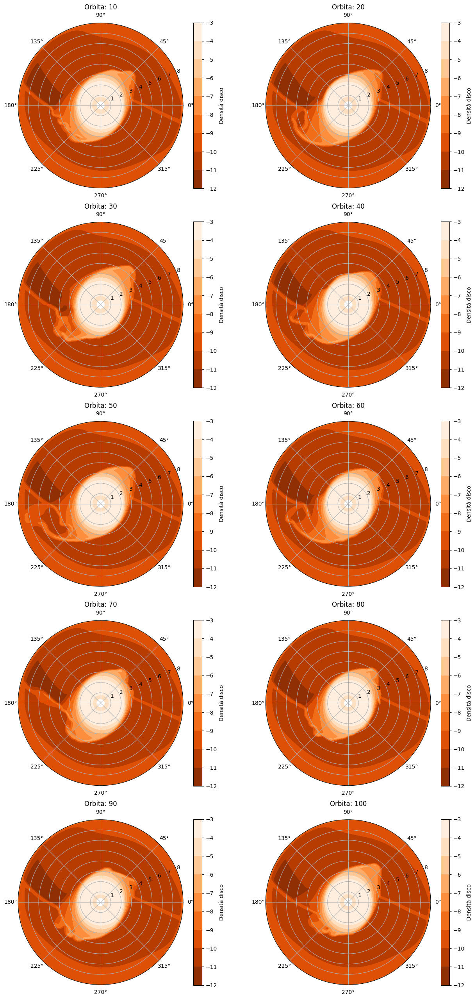

In [3]:
# Impostare il numero di grafici polari che desideri nella stessa figura
num_grafici = 10

# Creare una griglia di valori R e Theta
theta = np.linspace(-np.pi, np.pi, 384)
r = np.linspace(0.4, 8, 128)
Theta, R = np.meshgrid(theta, r)

# Creare una figura con più grafici polari
fig, axs = plt.subplots(5, 2, figsize=(15, 32), subplot_kw={'projection': 'polar'})

for i in range(0, 5):
    for j in range(0, 2):
        ax = axs[i, j]

        #Valori assunti dalla funzione
        rho = np.fromfile("Dati/Sistema2/PrimaRun/gasdens"+ str((2*i+j+1)*200) + ".dat").reshape(128, 384)

        # Disegnare il grafico polare
        cax = ax.contourf(Theta, R, np.log10(rho), cmap=cm.Oranges_r)
        plt.colorbar(cax, label='Densità disco')
        ax.set_rmin(0)
        ax.set_rmax(8)
        ax.set_title(f'Orbita: ' + str((2*i+j+1)*5*2))
    
    

# Mostrare la figura con i grafici polari multipli
plt.show()

### Due orbite

Mi concentro ora su quanto accade durante la prima orbita. Stampo allora la situazione del disco ogni decimo di orbita.

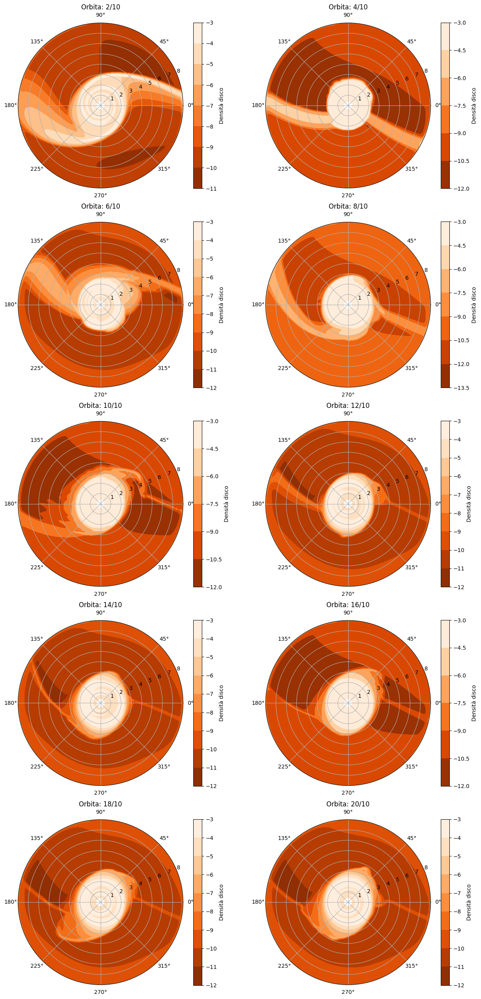

In [4]:
# Impostare il numero di grafici polari che desideri nella stessa figura
num_grafici = 10

# Creare una griglia di valori R e Theta
theta = np.linspace(-np.pi, np.pi, 384)
r = np.linspace(0.4, 8, 128)
Theta, R = np.meshgrid(theta, r)

# Creare una figura con più grafici polari
fig, axs = plt.subplots(5, 2, figsize=(15, 32), subplot_kw={'projection': 'polar'})

for i in range(0, 5):
    for j in range(0, 2):
        ax = axs[i, j]

        #Valori assunti dalla funzione
        rho = np.fromfile("Dati/Sistema2/PrimaRun/gasdens"+ str((2*i+j+1)*4) + ".dat").reshape(128, 384)

        # Disegnare il grafico polare
        cax = ax.contourf(Theta, R, np.log10(rho), cmap=cm.Oranges_r)
        plt.colorbar(cax, label='Densità disco')
        ax.set_rmin(0)
        ax.set_rmax(8)
        ax.set_title(f'Orbita: ' + str((2*i+j+1)*2) + '/10')
    
    

# Mostrare la figura con i grafici polari multipli
plt.show()

### Primi dieci output

Noto che il sistema nelle prime fasi della sua evoluzione lancia delle spirali molto lunghe che tendono ad uscire dalla griglia stessa. Analizzo allora cosa accade durante i primi dieci output per capire come riuscire a gestire questa cosa: è meglio ampliare la griglia? Diminuire le dimensioni del disco con cui inizializzo il sistema?

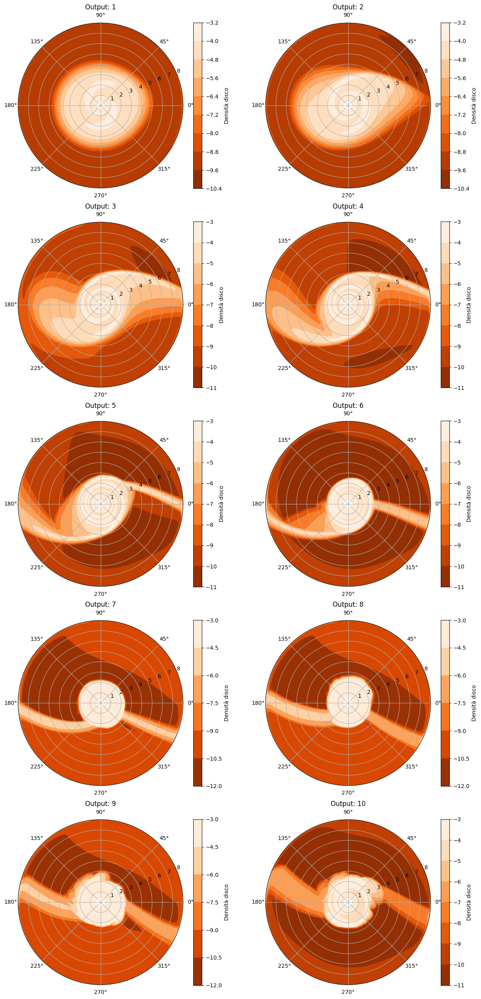

In [5]:
# Impostare il numero di grafici polari che desideri nella stessa figura
num_grafici = 10

# Creare una griglia di valori R e Theta
theta = np.linspace(-np.pi, np.pi, 384)
r = np.linspace(0.4, 8, 128)
Theta, R = np.meshgrid(theta, r)

# Creare una figura con più grafici polari
fig, axs = plt.subplots(5, 2, figsize=(15, 32), subplot_kw={'projection': 'polar'})

for i in range(0, 5):
    for j in range(0, 2):
        ax = axs[i, j]

        #Valori assunti dalla funzione
        rho = np.fromfile("Dati/Sistema2/PrimaRun/gasdens"+ str((2*i+j+1)) + ".dat").reshape(128, 384)

        # Disegnare il grafico polare
        cax = ax.contourf(Theta, R, np.log10(rho), cmap=cm.Oranges_r)
        plt.colorbar(cax, label='Densità disco')
        ax.set_rmin(0)
        ax.set_rmax(8)
        ax.set_title(f'Output: ' + str((2*i+j+1)))
    
    

# Mostrare la figura con i grafici polari multipli
plt.show()

<center>

# <span style="color:blue;">Seconda Run</span>

<center>

### Condizione iniziale

Provo ad aumentare le dimensioni della griglia in modo tale da vedere se le spirali riescono a rimanere confinate nella griglia stessa. In particolare provo a usare una griglia tale da avere anche l'altra stella nella regione simulata.

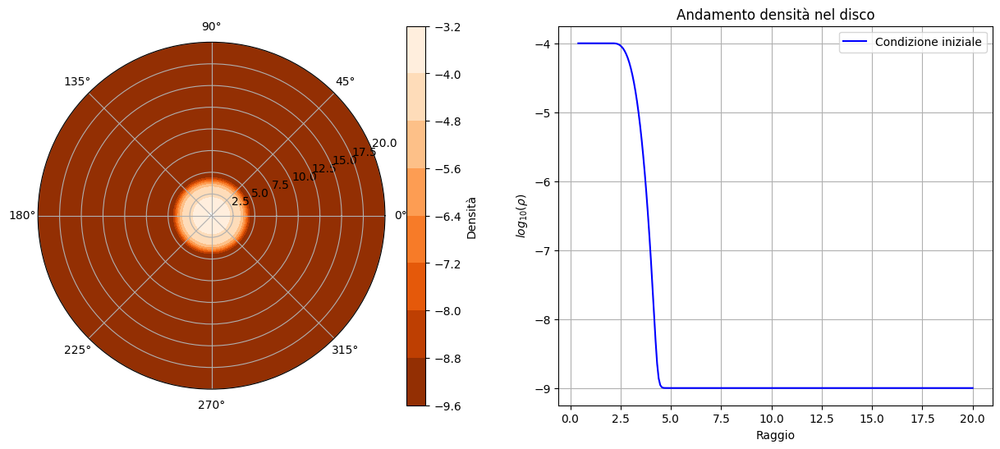

In [6]:
fig = plt.figure(figsize=(15, 6))

# Creare una griglia di valori R e Theta
theta = np.linspace(-np.pi, np.pi, 768)
r = np.linspace(0.4, 20, 256)
Theta, R = np.meshgrid(theta, r)

#Grafico 1
ax1 = fig.add_subplot(1, 2, 1, projection='polar')
rho = np.fromfile("Dati/Sistema2/SecondaRun/gasdens0.dat").reshape(256,768)
cax = ax1.contourf(Theta, R, np.log10(rho), cmap=cm.Oranges_r)
plt.colorbar(cax, label='Densità')
ax1.set_rmin(0)
ax1.set_rmax(20)


#Grafico 2
ax2 = fig.add_subplot(1, 2, 2)
den_sup = np.zeros(256)

#Determino andamento della densità superficiale
for i in range(0, 256):
    appo = 0
    for j in range(0, 768):
        appo += np.log10(rho[i, j])

    appo = appo/768
    den_sup[i] = appo

ax2.plot(np.linspace(0.4, 20, 256), den_sup[:], color = 'blue', label = 'Condizione iniziale')
ax2.set_title('Andamento densità nel disco')
ax2.set_xlabel('Raggio')
ax2.set_ylabel(r'$log_{10}(\rho)$')
ax2.grid(True)
ax2.legend()

plt.show()

### Singola orbita

Mi concentro sulla prima orbita. Dato che essa viene completata dopo 20.784 output non avrò la possibilità di graficare esattamente una singola orbita. In particolare ho che:

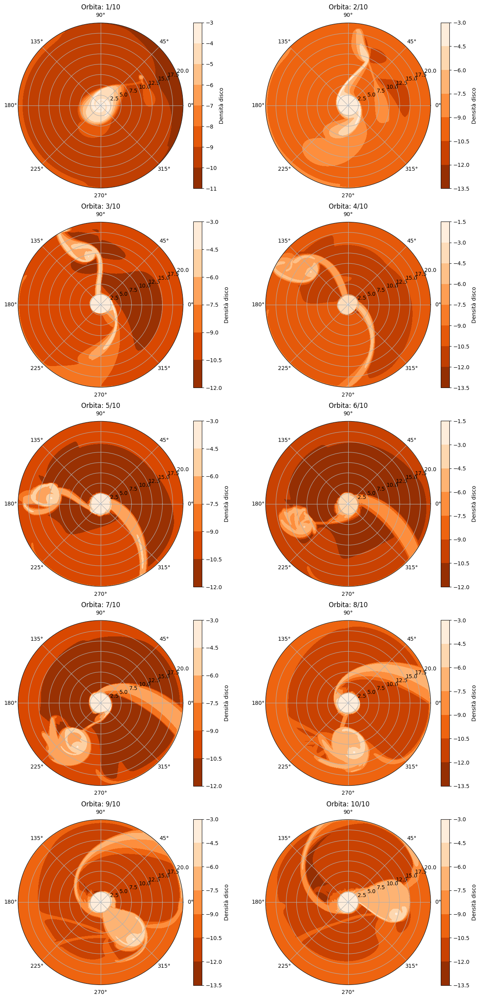

In [7]:
# Impostare il numero di grafici polari che desideri nella stessa figura
num_grafici = 10

# Creare una griglia di valori R e Theta
theta = np.linspace(-np.pi, np.pi, 768)
r = np.linspace(0.4, 20, 256)
Theta, R = np.meshgrid(theta, r)

# Creare una figura con più grafici polari
fig, axs = plt.subplots(5, 2, figsize=(15, 32), subplot_kw={'projection': 'polar'})

for i in range(0, 5):
    for j in range(0, 2):
        ax = axs[i, j]

        #Valori assunti dalla funzione
        rho = np.fromfile("Dati/Sistema2/SecondaRun/gasdens"+ str((2*i+j+1)*2) + ".dat").reshape(256, 768)

        # Disegnare il grafico polare
        cax = ax.contourf(Theta, R, np.log10(rho), cmap=cm.Oranges_r)
        plt.colorbar(cax, label='Densità disco')
        ax.set_rmin(0)
        ax.set_rmax(20)
        ax.set_title(f'Orbita: ' + str((2*i+j+1)) + '/10')
    
    

# Mostrare la figura con i grafici polari multipli
plt.show()

### Dieci orbite

Ho simulato circa dieci orbite, di seguito riporto quanto ottenuto.

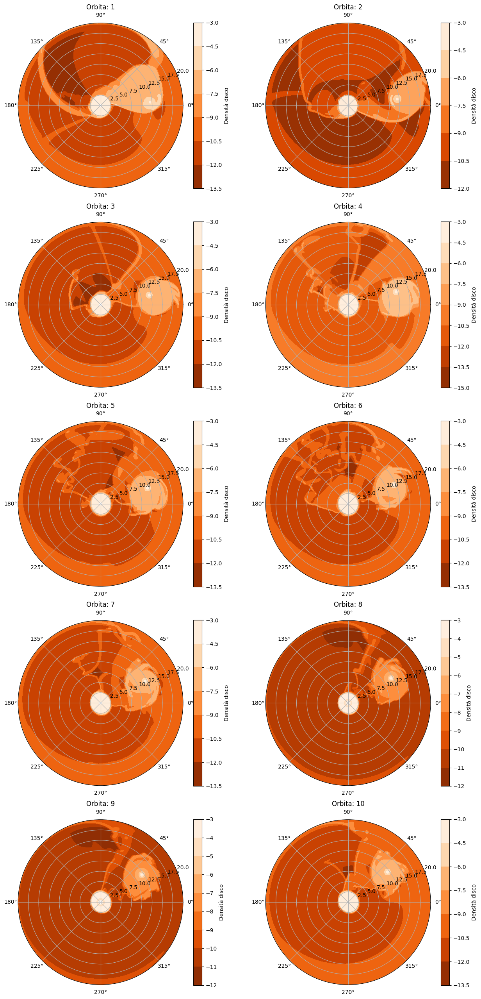

In [8]:
# Impostare il numero di grafici polari che desideri nella stessa figura
num_grafici = 10

# Creare una griglia di valori R e Theta
theta = np.linspace(-np.pi, np.pi, 768)
r = np.linspace(0.4, 20, 256)
Theta, R = np.meshgrid(theta, r)

# Creare una figura con più grafici polari
fig, axs = plt.subplots(5, 2, figsize=(15, 32), subplot_kw={'projection': 'polar'})

for i in range(0, 5):
    for j in range(0, 2):
        ax = axs[i, j]

        #Valori assunti dalla funzione
        rho = np.fromfile("Dati/Sistema2/SecondaRun/gasdens"+ str((2*i+j+1)*21) + ".dat").reshape(256, 768)

        # Disegnare il grafico polare
        cax = ax.contourf(Theta, R, np.log10(rho), cmap=cm.Oranges_r)
        plt.colorbar(cax, label='Densità disco')
        ax.set_rmin(0)
        ax.set_rmax(20)
        ax.set_title(f'Orbita: ' + str((2*i+j+1)))
    
    

# Mostrare la figura con i grafici polari multipli
plt.show()

### Profilo di densità

Provo ora a concentrarmi sulle istantanee fra la nona e la decima orbita. In particolare quello che voglio fare è andare a tracciare il profilo di densità del disco.

In [9]:
dens = np.zeros(128)

#Itero sulle varie configurazioni considerate
for k in range(0, 22):
    #Considero configurazione desiderata
    rho = np.fromfile("Dati/Sistema2/SecondaRun/gasdens" +str(189+k)+".dat").reshape(256,768)

    #Determino andamento della densità superficiale
    for i in range(0, 128):
        appo = 0
        for j in range(0, 768):
            appo += np.log10(rho[i, j])

        appo = appo/768
        dens[i] += appo

dens = dens/22  

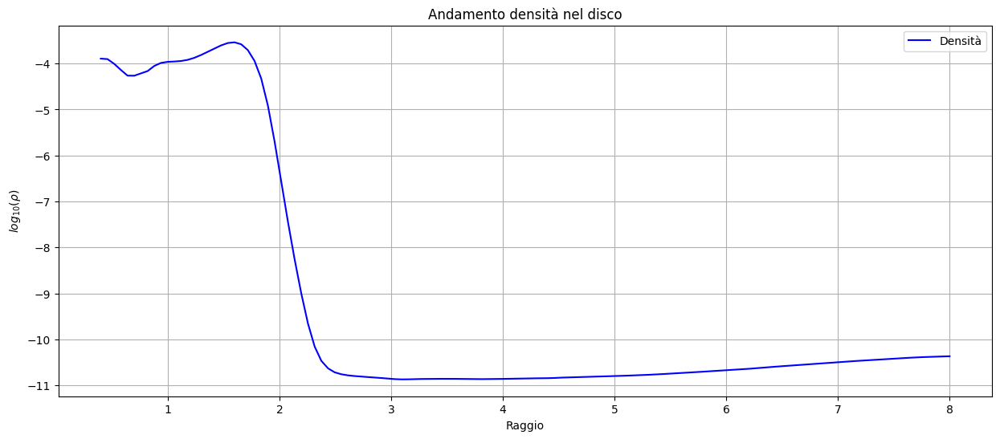

In [10]:
fig = plt.figure(figsize = (15, 6))
x = np.linspace(0.4, 8, 128)
plt.plot(x, dens, color = 'blue', label = 'Densità')
plt.title('Andamento densità nel disco')
plt.xlabel('Raggio')
plt.ylabel(r'$log_{10}(\rho)$')

plt.grid(True)
plt.legend()
plt.show()

### Primi dieci output

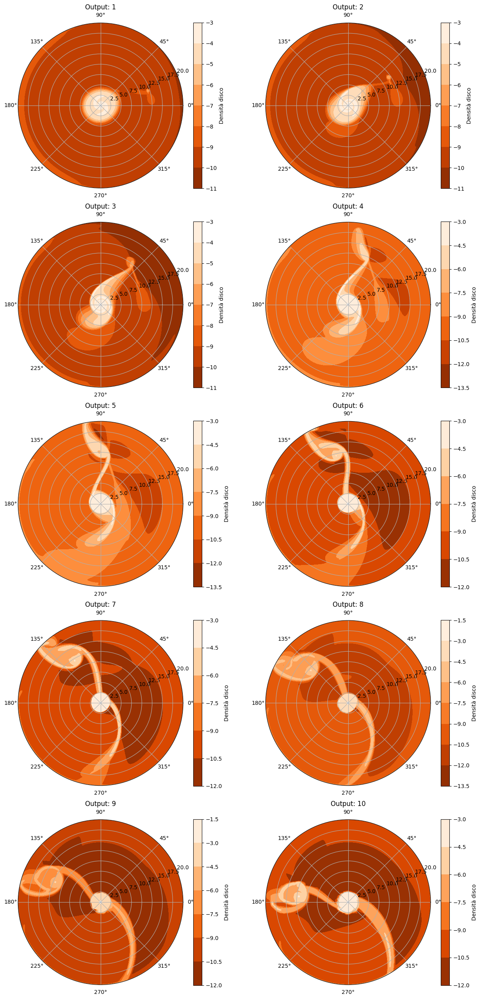

In [11]:
# Impostare il numero di grafici polari che desideri nella stessa figura
num_grafici = 10

# Creare una griglia di valori R e Theta
theta = np.linspace(-np.pi, np.pi, 768)
r = np.linspace(0.4, 20, 256)
Theta, R = np.meshgrid(theta, r)

# Creare una figura con più grafici polari
fig, axs = plt.subplots(5, 2, figsize=(15, 32), subplot_kw={'projection': 'polar'})

for i in range(0, 5):
    for j in range(0, 2):
        ax = axs[i, j]

        #Valori assunti dalla funzione
        rho = np.fromfile("Dati/Sistema2/SecondaRun/gasdens"+ str((2*i+j+1)) + ".dat").reshape(256, 768)

        # Disegnare il grafico polare
        cax = ax.contourf(Theta, R, np.log10(rho), cmap=cm.Oranges_r)
        plt.colorbar(cax, label='Densità disco')
        ax.set_rmin(0)
        ax.set_rmax(20)
        ax.set_title(f'Output: ' + str((2*i+j+1)))
    
    

# Mostrare la figura con i grafici polari multipli
plt.show()

<center>

# <span style="color:blue;">Terza Run</span>

<center>

Nella terza run lavoro con lo stesso sistema fisico, tenendo ancora il dumping, ma restringendomi ad una regione minore del disco, ossia tenendo fino a r = 6. Di seguito quanto osservo.

### Condizione iniziale

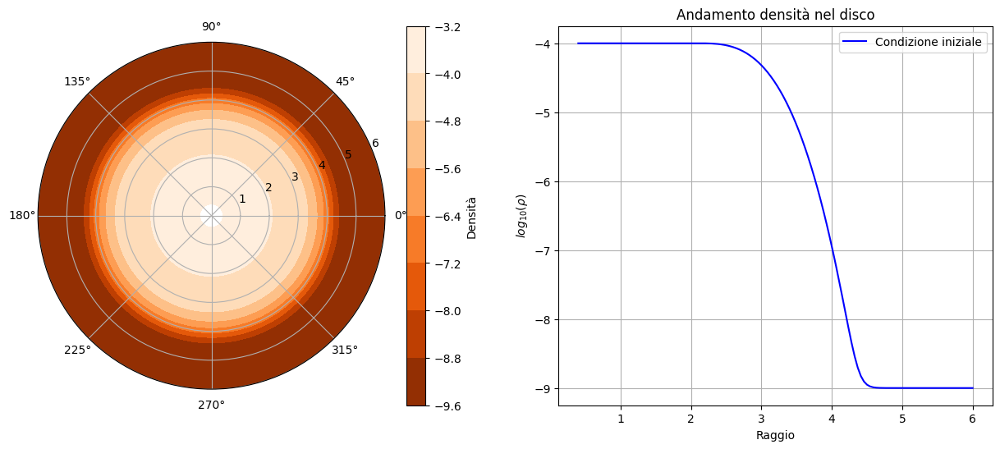

In [12]:
fig = plt.figure(figsize=(15, 6))

# Creare una griglia di valori R e Theta
theta = np.linspace(-np.pi, np.pi, 384)
r = np.linspace(0.4, 6, 128)
Theta, R = np.meshgrid(theta, r)

#Grafico 1
ax1 = fig.add_subplot(1, 2, 1, projection='polar')
rho = np.fromfile("Dati/Sistema2/TerzaRun/gasdens0.dat").reshape(128,384)
cax = ax1.contourf(Theta, R, np.log10(rho), cmap=cm.Oranges_r)
plt.colorbar(cax, label='Densità')
ax1.set_rmin(0)
ax1.set_rmax(6)


#Grafico 2
ax2 = fig.add_subplot(1, 2, 2)
den_sup = np.zeros(128)

#Determino andamento della densità superficiale
for i in range(0, 128):
    appo = 0
    for j in range(0, 384):
        appo += np.log10(rho[i, j])

    appo = appo/384
    den_sup[i] = appo

ax2.plot(np.linspace(0.4, 6, 128), den_sup[:], color = 'blue', label = 'Condizione iniziale')
ax2.set_title('Andamento densità nel disco')
ax2.set_xlabel('Raggio')
ax2.set_ylabel(r'$log_{10}(\rho)$')
ax2.grid(True)
ax2.legend()

plt.show()

### Orbite

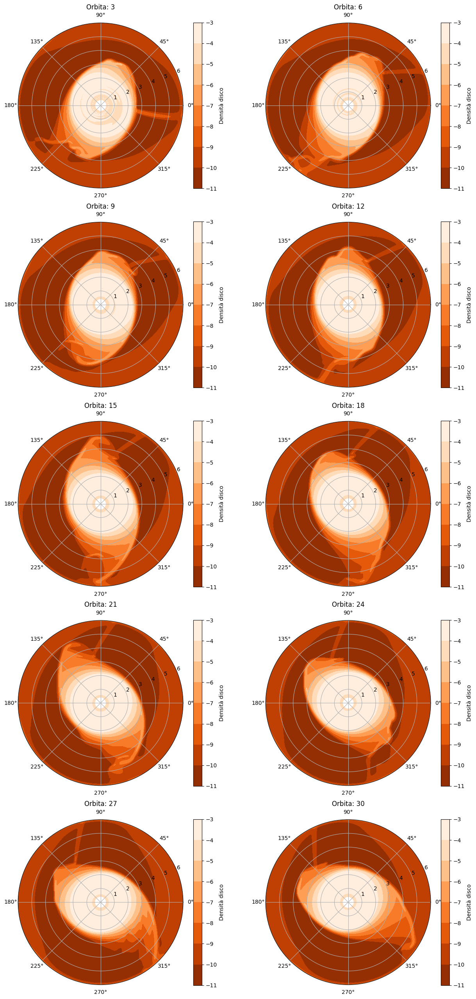

In [13]:
# Impostare il numero di grafici polari che desideri nella stessa figura
num_grafici = 10

# Creare una griglia di valori R e Theta
theta = np.linspace(-np.pi, np.pi, 384)
r = np.linspace(0.4, 6, 128)
Theta, R = np.meshgrid(theta, r)

# Creare una figura con più grafici polari
fig, axs = plt.subplots(5, 2, figsize=(15, 32), subplot_kw={'projection': 'polar'})

for i in range(0, 5):
    for j in range(0, 2):
        ax = axs[i, j]

        #Valori assunti dalla funzione
        rho = np.fromfile("Dati/Sistema2/TerzaRun/gasdens"+ str((2*i+j+1)*63) + ".dat").reshape(128, 384)

        # Disegnare il grafico polare
        cax = ax.contourf(Theta, R, np.log10(rho), cmap=cm.Oranges_r)
        plt.colorbar(cax, label='Densità disco')
        ax.set_rmin(0)
        ax.set_rmax(6)
        ax.set_title(f'Orbita: ' + str((2*i+j+1)*3))
    
    

# Mostrare la figura con i grafici polari multipli
plt.show()

### Prima orbita

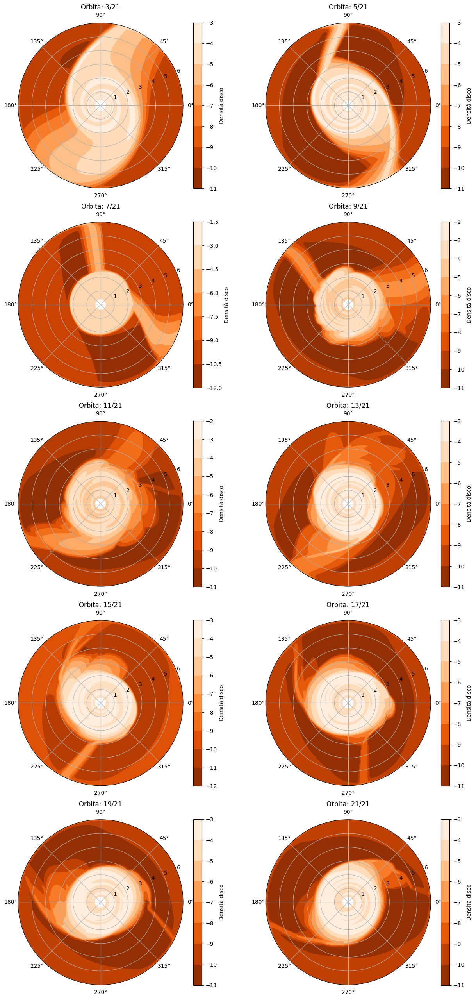

In [14]:
# Impostare il numero di grafici polari che desideri nella stessa figura
num_grafici = 10

# Creare una griglia di valori R e Theta
theta = np.linspace(-np.pi, np.pi, 384)
r = np.linspace(0.4, 6, 128)
Theta, R = np.meshgrid(theta, r)

# Creare una figura con più grafici polari
fig, axs = plt.subplots(5, 2, figsize=(15, 32), subplot_kw={'projection': 'polar'})

for i in range(0, 5):
    for j in range(0, 2):
        ax = axs[i, j]

        #Valori assunti dalla funzione
        rho = np.fromfile("Dati/Sistema2/TerzaRun/gasdens"+ str((2*i+j+1)*2+1) + ".dat").reshape(128, 384)

        # Disegnare il grafico polare
        cax = ax.contourf(Theta, R, np.log10(rho), cmap=cm.Oranges_r)
        plt.colorbar(cax, label='Densità disco')
        ax.set_rmin(0)
        ax.set_rmax(6)
        ax.set_title(f'Orbita: ' + str((2*i+j+1)*2 + 1) + '/21')
    
    

# Mostrare la figura con i grafici polari multipli
plt.show()

### Primi output

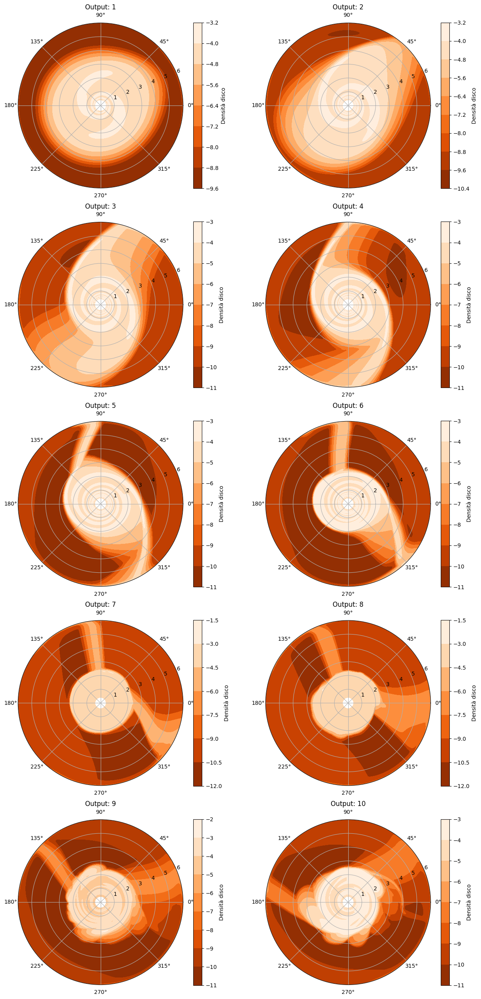

In [15]:
# Impostare il numero di grafici polari che desideri nella stessa figura
num_grafici = 10

# Creare una griglia di valori R e Theta
theta = np.linspace(-np.pi, np.pi, 384)
r = np.linspace(0.4, 6, 128)
Theta, R = np.meshgrid(theta, r)

# Creare una figura con più grafici polari
fig, axs = plt.subplots(5, 2, figsize=(15, 32), subplot_kw={'projection': 'polar'})

for i in range(0, 5):
    for j in range(0, 2):
        ax = axs[i, j]

        #Valori assunti dalla funzione
        rho = np.fromfile("Dati/Sistema2/TerzaRun/gasdens"+ str((2*i+j+1)) + ".dat").reshape(128, 384)

        # Disegnare il grafico polare
        cax = ax.contourf(Theta, R, np.log10(rho), cmap=cm.Oranges_r)
        plt.colorbar(cax, label='Densità disco')
        ax.set_rmin(0)
        ax.set_rmax(6)
        ax.set_title(f'Output: ' + str((2*i+j+1)))
    
    

# Mostrare la figura con i grafici polari multipli
plt.show()

### Profilo di densità

In [16]:
dens = np.zeros(128)

#Itero sulle varie configurazioni considerate
for k in range(0, 22):
    #Considero configurazione desiderata
    rho = np.fromfile("Dati/Sistema2/TerzaRun/gasdens" +str(609+k)+".dat").reshape(128,384)

    #Determino andamento della densità superficiale
    for i in range(0, 128):
        appo = 0
        for j in range(0, 384):
            appo += np.log10(rho[i, j])

        appo = appo/384
        dens[i] += appo

dens = dens/22  

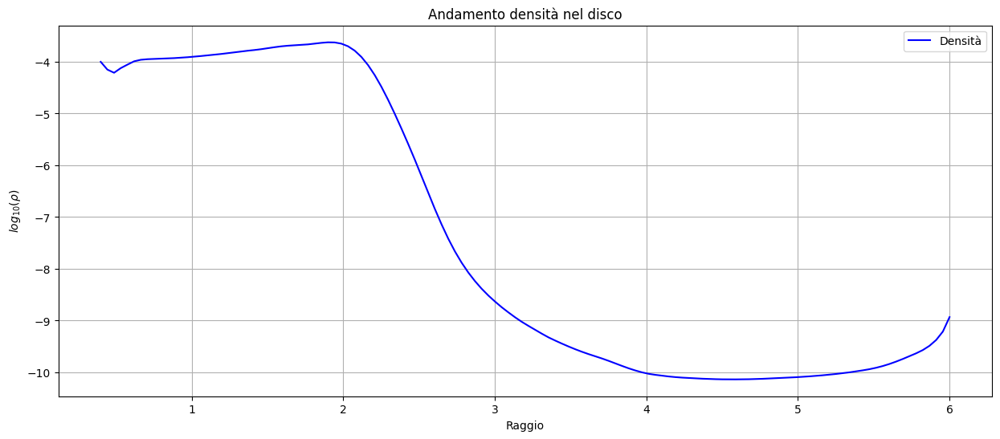

In [17]:
fig = plt.figure(figsize = (15, 6))
x = np.linspace(0.4, 6, 128)
plt.plot(x, dens, color = 'blue', label = 'Densità')
plt.title('Andamento densità nel disco')
plt.xlabel('Raggio')
plt.ylabel(r'$log_{10}(\rho)$')

plt.grid(True)
plt.legend()
plt.show()

<center>

# <span style="color:blue;">Quarta Run</span>

<center>

Nella quarta run simulo finalmente il setup desiderato, andando a togliere definitivamente il dumping.

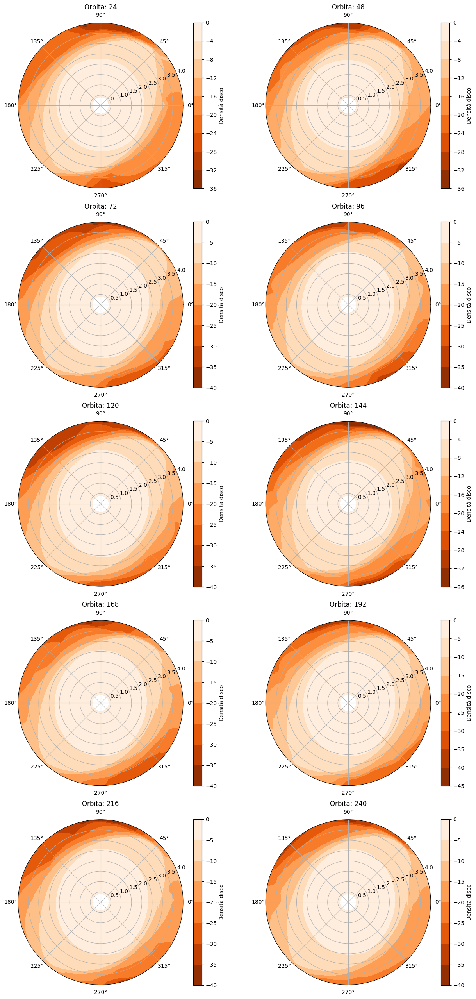

In [18]:
# Impostare il numero di grafici polari che desideri nella stessa figura
num_grafici = 10

# Creare una griglia di valori R e Theta
theta = np.linspace(-np.pi, np.pi, 384)
r = np.linspace(0.4, 4, 128)
Theta, R = np.meshgrid(theta, r)

# Creare una figura con più grafici polari
fig, axs = plt.subplots(5, 2, figsize=(15, 32), subplot_kw={'projection': 'polar'})

for i in range(0, 5):
    for j in range(0, 2):
        ax = axs[i, j]

        #Valori assunti dalla funzione
        rho = np.fromfile("Dati/Sistema2/QuartaRun/gasdens"+ str((2*i+j+1)*24) + ".dat").reshape(128, 384)

        # Disegnare il grafico polare
        cax = ax.contourf(Theta, R, np.log10(rho), cmap=cm.Oranges_r)
        plt.colorbar(cax, label='Densità disco')
        ax.set_rmin(0)
        ax.set_rmax(4)
        ax.set_title(f'Orbita: ' + str((2*i+j+1)*24))
    
    

# Mostrare la figura con i grafici polari multipli
plt.show()

### Profilo densità

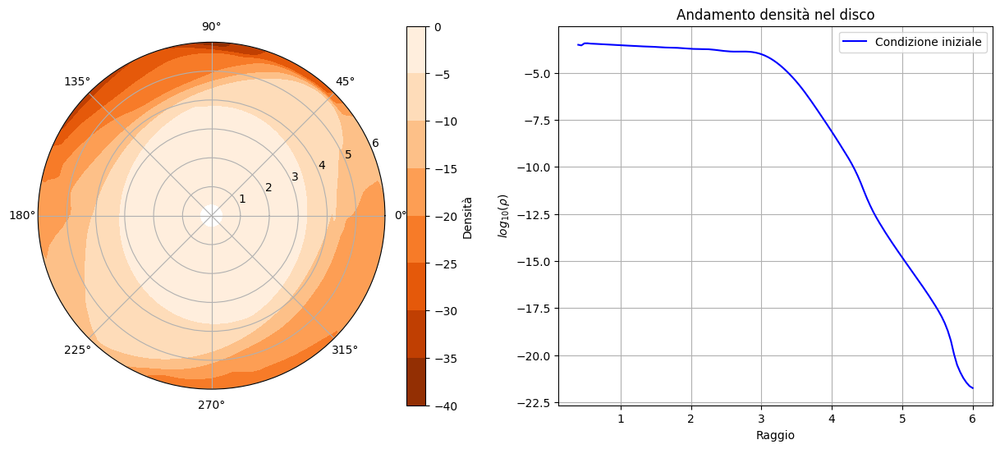

In [19]:
fig = plt.figure(figsize=(15, 6))

# Creare una griglia di valori R e Theta
theta = np.linspace(-np.pi, np.pi, 384)
r = np.linspace(0.4, 6, 128)
Theta, R = np.meshgrid(theta, r)

#Grafico 1
ax1 = fig.add_subplot(1, 2, 1, projection='polar')
rho = np.fromfile("Dati/Sistema2/QuartaRun/gasdens240.dat").reshape(128,384)
cax = ax1.contourf(Theta, R, np.log10(rho), cmap=cm.Oranges_r)
plt.colorbar(cax, label='Densità')
ax1.set_rmin(0)
ax1.set_rmax(6)


#Grafico 2
ax2 = fig.add_subplot(1, 2, 2)
den_sup = np.zeros(128)

#Determino andamento della densità superficiale
for i in range(0, 128):
    appo = 0
    for j in range(0, 384):
        appo += np.log10(rho[i, j])

    appo = appo/384
    den_sup[i] = appo

ax2.plot(np.linspace(0.4, 6, 128), den_sup[:], color = 'blue', label = 'Condizione iniziale')
ax2.set_title('Andamento densità nel disco')
ax2.set_xlabel('Raggio')
ax2.set_ylabel(r'$log_{10}(\rho)$')
ax2.grid(True)
ax2.legend()

plt.show()

### Determino raggio di troncamento

Provo a implementare diverse metodologie per la determinazione del raggio di troncamento:
- raggio contenente il 99.9% della massa dell'intera regione simulata

- raggio dove ottengo la half-maximum density

In [28]:
#Importo la densità considerata
rho = np.fromfile("Dati/Sistema2/QuartaRun/gasdens240.dat").reshape(128,384)
massa = 0

for i in range(0,128):
    #Calcolo area della singola sezione
    area = np.pi * (pow(((i+1)*(4-0.4)/128 + 0.4),2)-pow((i*(4-0.4)/128 + 0.4),2))
    area = area/384

    for j in range(0, 384):
        massa += area * rho[i, j]

#Controllo ora dove ottengo il 99% della massa
appo = 0
raggio = 0

for i in range(0,128):
    #Calcolo area della singola sezione
    area = np.pi * (pow(((i+1)*(4-0.4)/128 + 0.4),2)-pow((i*(4-0.4)/128 + 0.4),2))
    area = area/384

    raggio = (i+1)*(4-0.4)/128 + 0.4

    for j in range(0, 384):
        appo += area * rho[i, j]
    
    if appo >= 0.999*massa:
        break

print('Il raggio di troncamento del disco è pari a: ' + str(raggio))

Il raggio di troncamento del disco è pari a: 2.70625


<center>

# <span style="color:blue;">Quinta Run</span>

<center>

Nella quinta run voglio simulare il disco circum-primario. Per questo motivo "inverto le stelle".

### Condizione iniziale

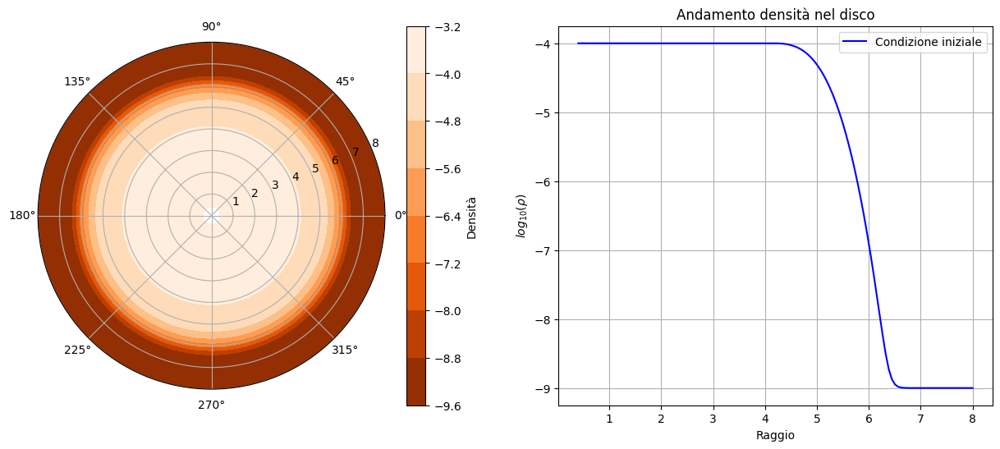

In [21]:
fig = plt.figure(figsize=(15, 6))

# Creare una griglia di valori R e Theta
theta = np.linspace(-np.pi, np.pi, 384)
r = np.linspace(0.4, 8, 128)
Theta, R = np.meshgrid(theta, r)

#Grafico 1
ax1 = fig.add_subplot(1, 2, 1, projection='polar')
rho = np.fromfile("Dati/Sistema2/QuintaRun/gasdens0.dat").reshape(128,384)
cax = ax1.contourf(Theta, R, np.log10(rho), cmap=cm.Oranges_r)
plt.colorbar(cax, label='Densità')
ax1.set_rmin(0)
ax1.set_rmax(8)


#Grafico 2
ax2 = fig.add_subplot(1, 2, 2)
den_sup = np.zeros(128)

#Determino andamento della densità superficiale
for i in range(0, 128):
    appo = 0
    for j in range(0, 384):
        appo += np.log10(rho[i, j])

    appo = appo/384
    den_sup[i] = appo

ax2.plot(np.linspace(0.4, 8, 128), den_sup[:], color = 'blue', label = 'Condizione iniziale')
ax2.set_title('Andamento densità nel disco')
ax2.set_xlabel('Raggio')
ax2.set_ylabel(r'$log_{10}(\rho)$')
ax2.grid(True)
ax2.legend()

plt.show()

### Orbite

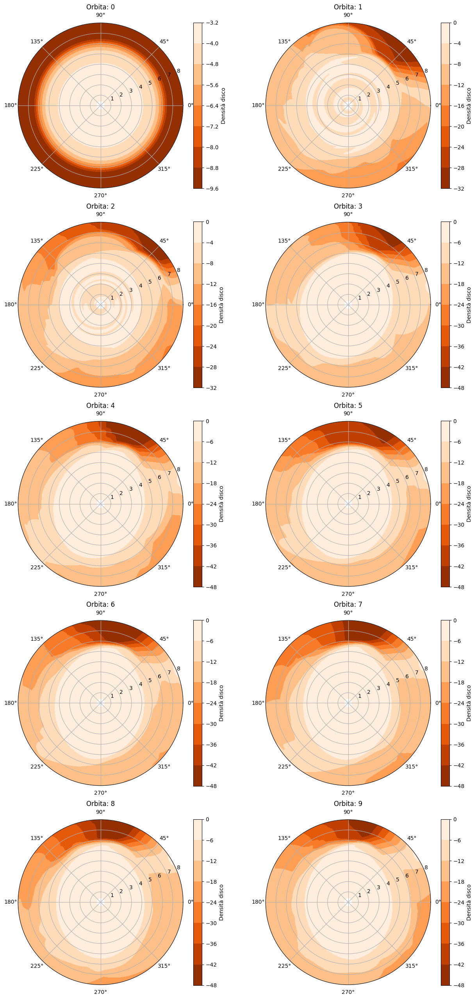

In [22]:
# Impostare il numero di grafici polari che desideri nella stessa figura
num_grafici = 10

# Creare una griglia di valori R e Theta
theta = np.linspace(-np.pi, np.pi, 384)
r = np.linspace(0.4, 8, 128)
Theta, R = np.meshgrid(theta, r)

# Creare una figura con più grafici polari
fig, axs = plt.subplots(5, 2, figsize=(15, 32), subplot_kw={'projection': 'polar'})

for i in range(0, 5):
    for j in range(0, 2):
        ax = axs[i, j]

        #Valori assunti dalla funzione
        rho = np.fromfile("Dati/Sistema2/QuintaRun/Orbite/gasdens"+ str((2*i+j)) + ".dat").reshape(128, 384)

        # Disegnare il grafico polare
        cax = ax.contourf(Theta, R, np.log10(rho), cmap=cm.Oranges_r)
        plt.colorbar(cax, label='Densità disco')
        ax.set_rmin(0)
        ax.set_rmax(8)
        ax.set_title(f'Orbita: ' + str((2*i+j)))
    
    

# Mostrare la figura con i grafici polari multipli
plt.show()

### Primi output

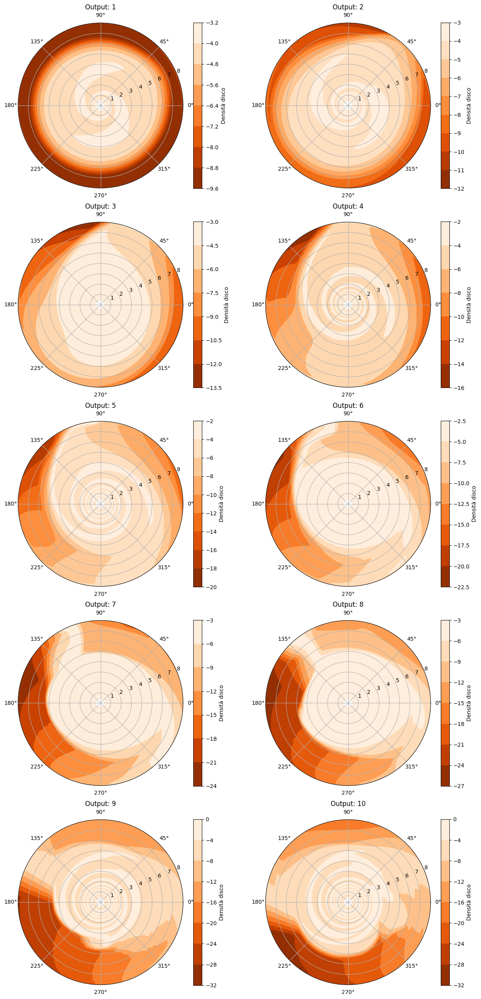

In [23]:
# Impostare il numero di grafici polari che desideri nella stessa figura
num_grafici = 10

# Creare una griglia di valori R e Theta
theta = np.linspace(-np.pi, np.pi, 384)
r = np.linspace(0.4, 8, 128)
Theta, R = np.meshgrid(theta, r)

# Creare una figura con più grafici polari
fig, axs = plt.subplots(5, 2, figsize=(15, 32), subplot_kw={'projection': 'polar'})

for i in range(0, 5):
    for j in range(0, 2):
        ax = axs[i, j]

        #Valori assunti dalla funzione
        rho = np.fromfile("Dati/Sistema2/QuintaRun/PrimiOut/gasdens"+ str((2*i+j+1)) + ".dat").reshape(128, 384)

        # Disegnare il grafico polare
        cax = ax.contourf(Theta, R, np.log10(rho), cmap=cm.Oranges_r)
        plt.colorbar(cax, label='Densità disco')
        ax.set_rmin(0)
        ax.set_rmax(8)
        ax.set_title(f'Output: ' + str((2*i+j+1)))
    
    

# Mostrare la figura con i grafici polari multipli
plt.show()

### Profilo densità

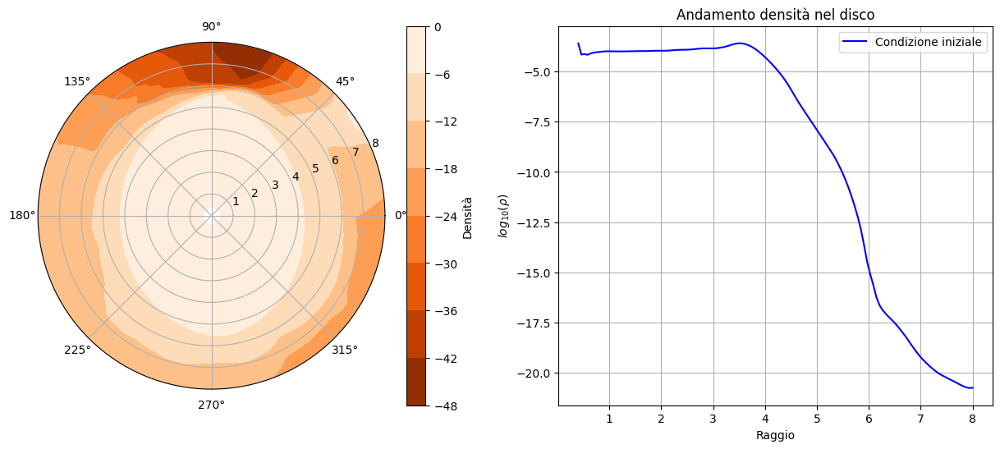

In [24]:
fig = plt.figure(figsize=(15, 6))

# Creare una griglia di valori R e Theta
theta = np.linspace(-np.pi, np.pi, 384)
r = np.linspace(0.4, 8, 128)
Theta, R = np.meshgrid(theta, r)

#Grafico 1
ax1 = fig.add_subplot(1, 2, 1, projection='polar')
rho = np.fromfile("Dati/Sistema2/QuintaRun/Orbite/gasdens9.dat").reshape(128,384)
cax = ax1.contourf(Theta, R, np.log10(rho), cmap=cm.Oranges_r)
plt.colorbar(cax, label='Densità')
ax1.set_rmin(0)
ax1.set_rmax(8)


#Grafico 2
ax2 = fig.add_subplot(1, 2, 2)
den_sup = np.zeros(128)

#Determino andamento della densità superficiale
for i in range(0, 128):
    appo = 0
    for j in range(0, 384):
        appo += np.log10(rho[i, j])

    appo = appo/384
    den_sup[i] = appo

ax2.plot(np.linspace(0.4, 8, 128), den_sup[:], color = 'blue', label = 'Condizione iniziale')
ax2.set_title('Andamento densità nel disco')
ax2.set_xlabel('Raggio')
ax2.set_ylabel(r'$log_{10}(\rho)$')
ax2.grid(True)
ax2.legend()

plt.show()

### Raggio di troncamento

In [25]:
#Importo la densità considerata
rho = np.fromfile("Dati/Sistema2/QuintaRun/Orbite/gasdens9.dat").reshape(128,384)
massa = 0

for i in range(0,128):
    #Calcolo area della singola sezione
    area = np.pi * (pow(((i+1)*(8-0.4)/128 + 0.4),2)-pow((i*(8-0.4)/128 + 0.4),2))
    area = area/384

    for j in range(0, 384):
        massa += area * rho[i, j]

#Controllo ora dove ottengo il 99% della massa
appo = 0
raggio = 0

for i in range(0,128):
    #Calcolo area della singola sezione
    area = np.pi * (pow(((i+1)*(8-0.4)/128 + 0.4),2)-pow((i*(8-0.4)/128 + 0.4),2))
    area = area/384

    raggio = (i+1)*(8-0.4)/128 + 0.4

    for j in range(0, 384):
        appo += area * rho[i, j]
    
    if appo >= 0.999*massa:
        break

print('Il raggio di troncamento del disco è pari a: ' + str(raggio))

Il raggio di troncamento del disco è pari a: 5.26875
